# Domínio da frequência, transformada de Fourier e transformada inversa de Fourier

## A. Implementar a transformada de Fourier
## B. Implementar a transformada inversa de Fourier
## C. Plotar o espectro de magnitude e o espectro de fase
## D. Comparar resultados com o ImageJ
## E. Plotar o espectro de magnitude em 3D 

### Importando bibliotecas

In [14]:
import numpy as np
from numpy import asarray
from PIL import Image
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import cv2

### apply_fourier_transform :: magnitude_spectrum, phase_spectrum, dft_shift
A função apply_fourier_transform recebe uma imagem como entrada e realiza as seguintes etapas: converte a imagem para escala de cinza, calcula a Transformada de Fourier Discreta (DFT) da imagem, desloca a origem da DFT para o centro (shift), calcula e normaliza o espectro de magnitude e a fase da DFT. Em seguida, a função exibe a imagem original, o espectro de magnitude e o espectro de fase em subplots e também plota gráficos 3D dos espectros de magnitude e fase.


<Figure size 432x288 with 0 Axes>

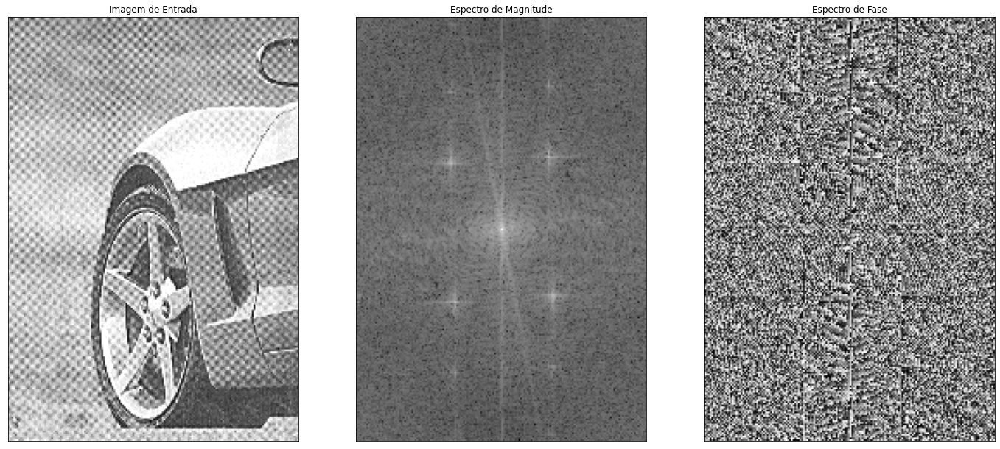

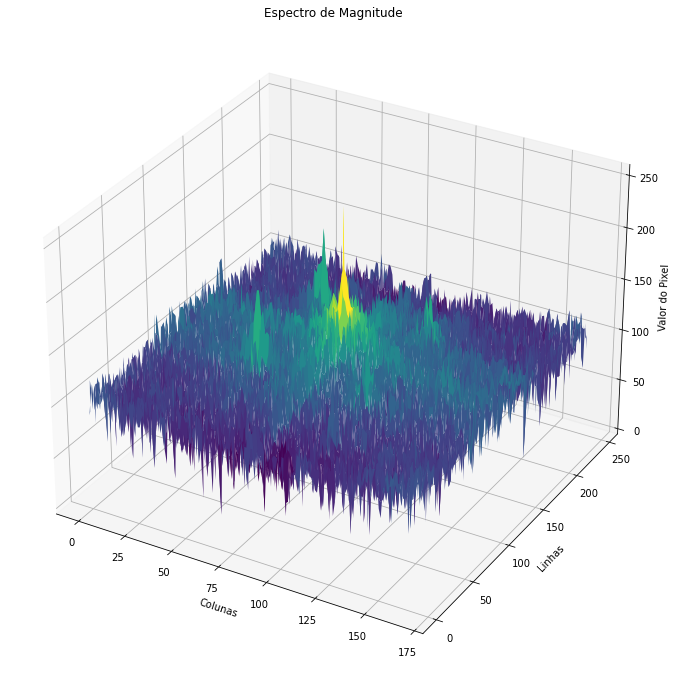

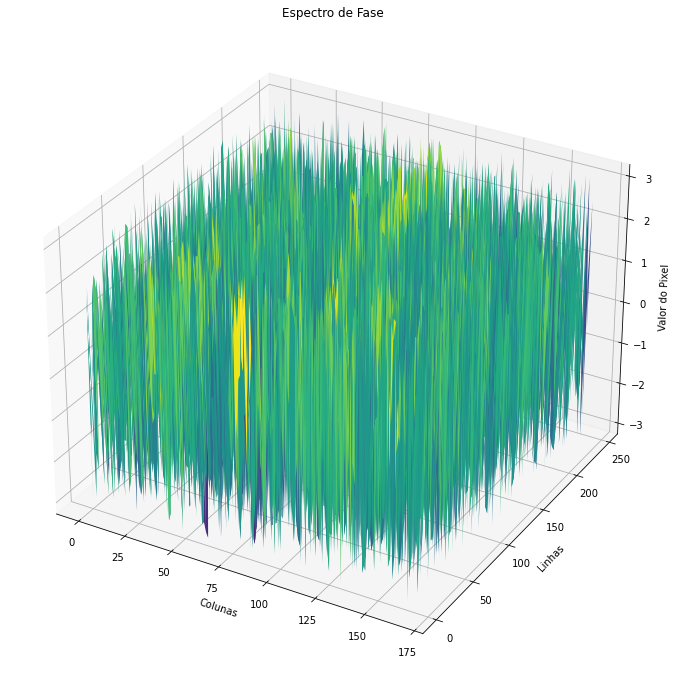

<Figure size 432x288 with 0 Axes>

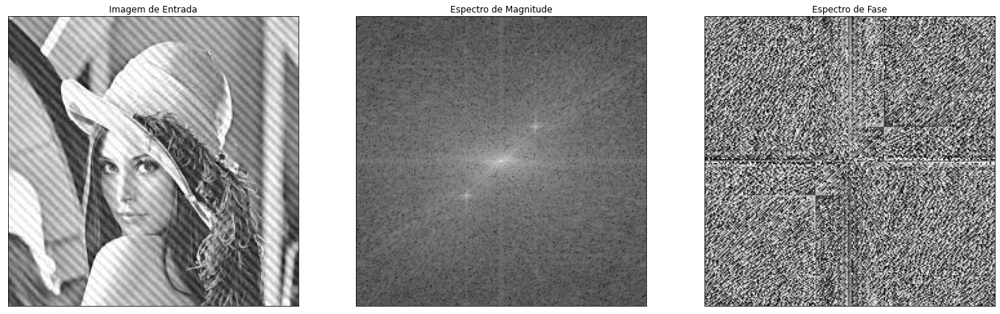

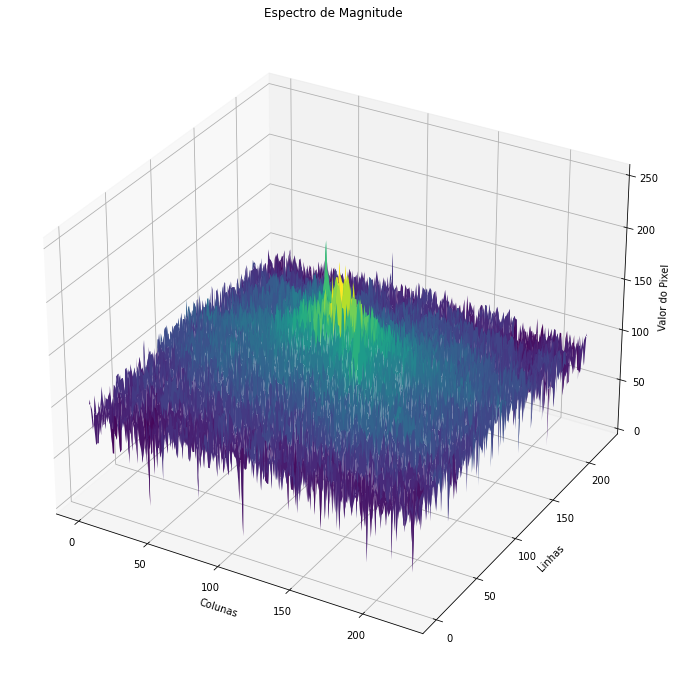

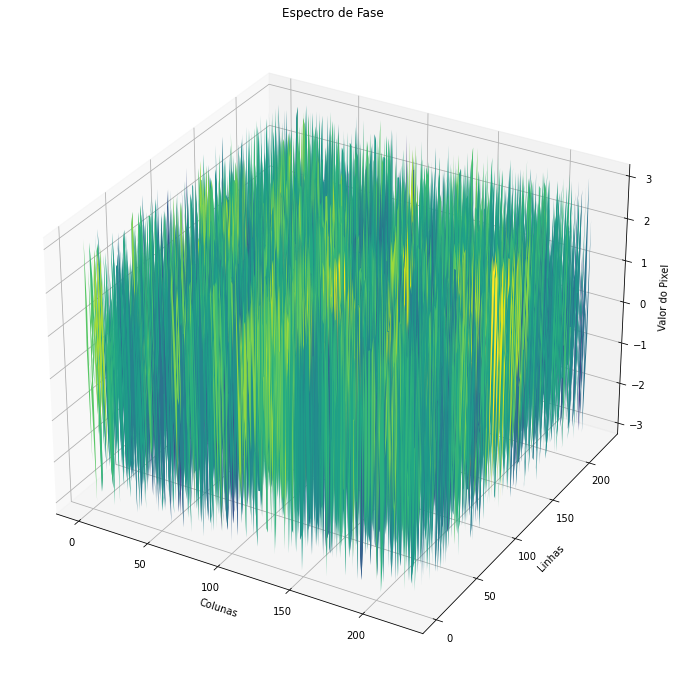

<Figure size 432x288 with 0 Axes>

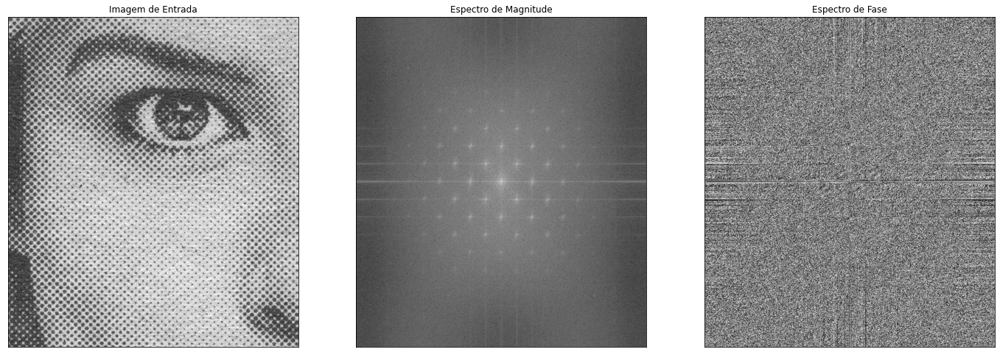

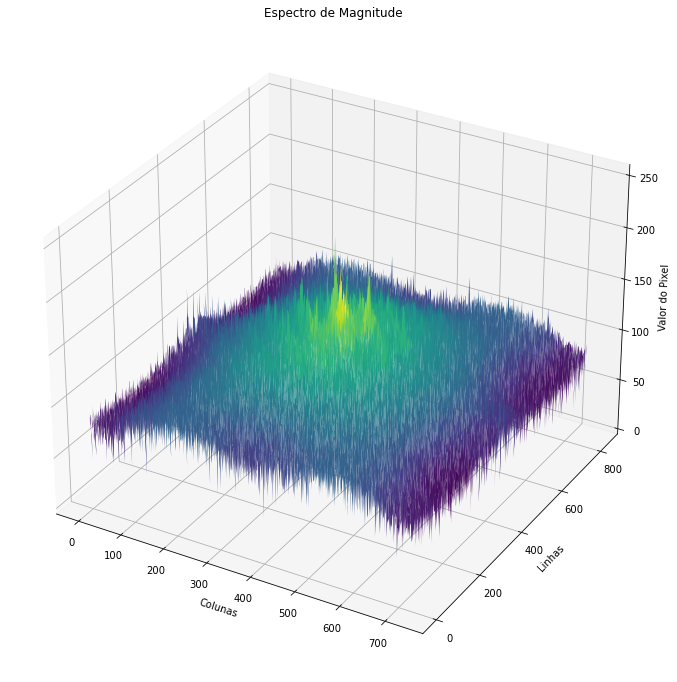

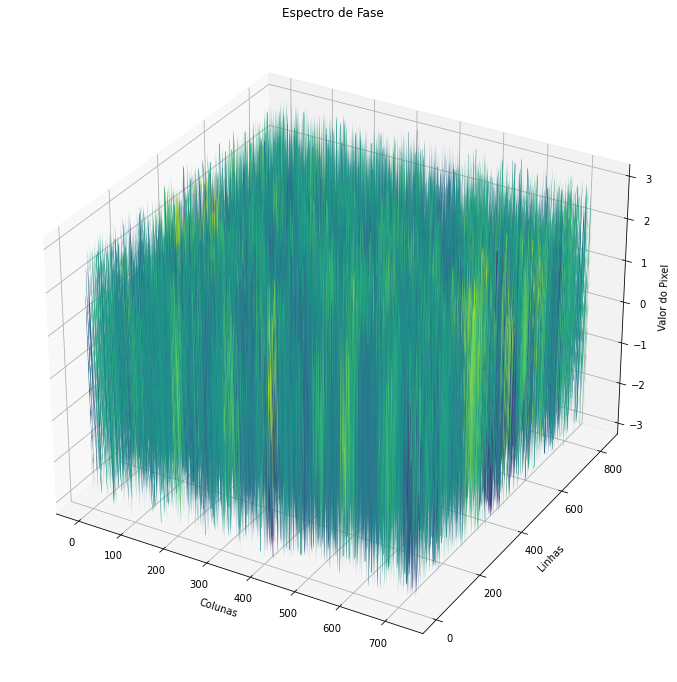

<Figure size 432x288 with 0 Axes>

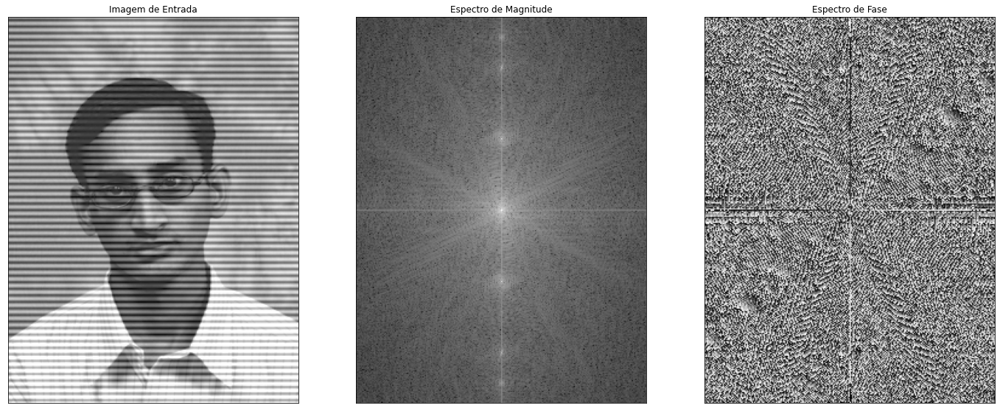

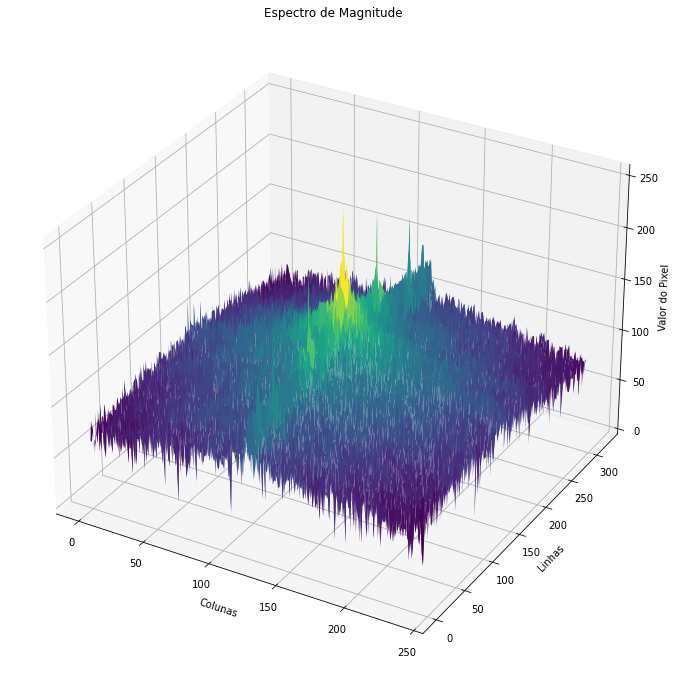

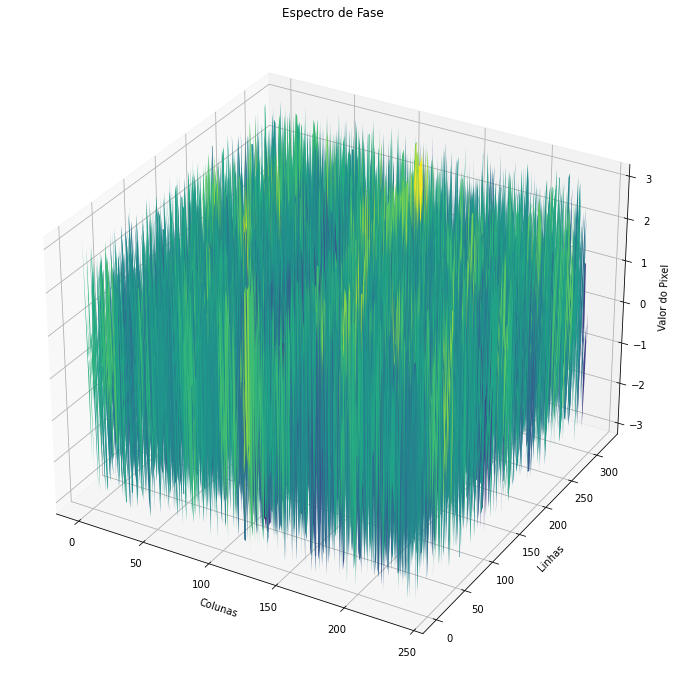

<Figure size 432x288 with 0 Axes>

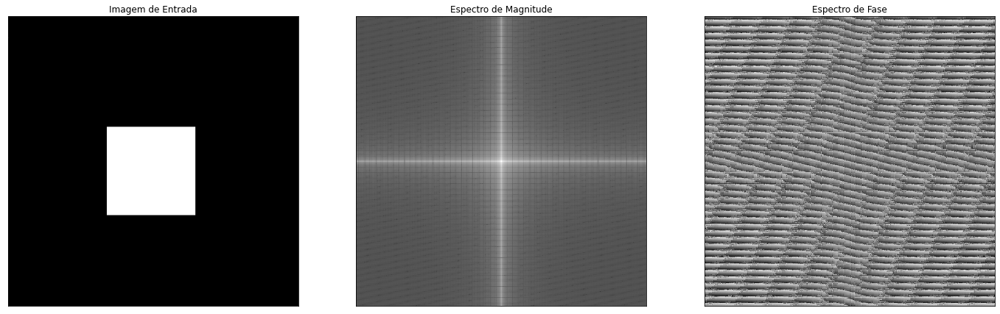

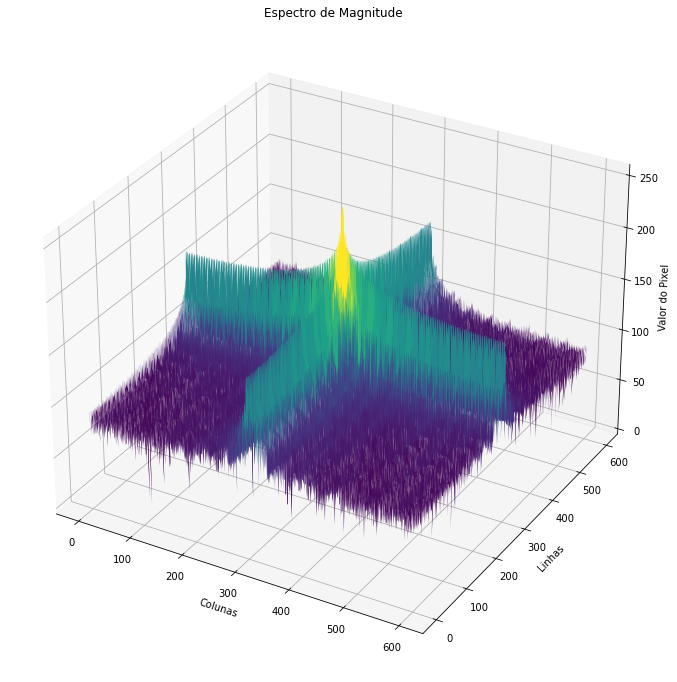

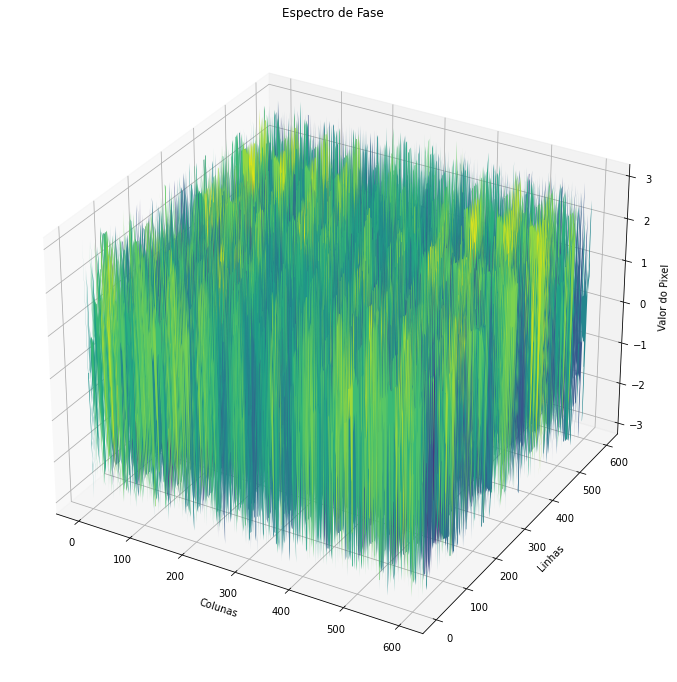

In [15]:
def apply_fourier_transform(img):
    # Converte a imagem para escala de cinza
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Calcula a DFT da imagem em escala de cinza
    dft = cv2.dft(np.float32(img_gray), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft = np.fft.fft2(img_gray)
    # Move a origem da DFT para o centro
    dft_shift = np.fft.fftshift(dft)

    # Calcula o espectro de magnitude da DFT
    # dft_shift[:, :, 0] = parte real
    # dft_real = dft_shift[:, :, 0]
    # dft_shift[:, :, 1] = parte imaginária
    # dft_imag = dft_shift[:, :, 1]
    # cv2.magnitude() = sqrt(Re(DFT(img))**2 + Im(DFT(img))**2)
    # magnitude_spectrum = 20*np.log(cv2.magnitude(dft_real, dft_imag)+1)
    magnitude_spectrum = 20*np.log(np.abs(dft_shift)+1)
    
    # Calcula o espectro de fase da DFT
    # phase_spectrum = np.angle(dft_real + 1j * dft_imag)
    phase_spectrum = np.angle(dft_shift)
    
    # Normaliza o espectro de magnitude para melhor visualização
    magnitude_spectrum = cv2.normalize(magnitude_spectrum, None, 0, 255, cv2.NORM_MINMAX)
    
    # Cria uma figura para exibir a imagem original, o espectro de magnitude e o espectro de fase
    plt.subplots_adjust(wspace=0.2, hspace=0.01) 
    plt.figure(figsize=(24, 12))
    
    # Subplot 1: Imagem original em escala de cinza
    plt1 = plt.subplot(1,3,1)
    plt1.set_title('Imagem de Entrada')
    plt1.set_xticks([]), plt1.set_yticks([])
    plt1.imshow(img_gray, cmap='gray')
    
    # Subplot 2: Espectro de Magnitude da DFT
    plt2 = plt.subplot(1,3,2)
    plt2.set_title('Espectro de Magnitude')
    plt2.set_xticks([]), plt2.set_yticks([])
    plt2.imshow(magnitude_spectrum, cmap='gray')
    
    # Subplot 3: Espectro de Fase da DFT
    plt3 = plt.subplot(1,3,3)
    plt3.set_title('Espectro de Fase')
    plt3.set_xticks([]), plt3.set_yticks([])
    plt3.imshow(phase_spectrum, cmap='gray')
    
    # Exibe a figura com as duas imagens
    plt.show()
    
    # Plota o gráfico 3D do espectro de magnitude

    # Crie uma grade de coordenadas x e y
    x = np.arange(0, magnitude_spectrum.shape[1], 1)
    y = np.arange(0, magnitude_spectrum.shape[0], 1)
    X, Y = np.meshgrid(x, y)

    # Crie uma figura 3D
    fig = plt.figure( figsize=(24,12) )
    ax = fig.add_subplot(111, projection='3d')

    # Plote o gráfico 3D
    ax.plot_surface(X, Y, magnitude_spectrum, cmap='viridis')
    ax.set_title('Espectro de Magnitude')
    # Defina rótulos dos eixos
    ax.set_xlabel('Colunas')
    ax.set_ylabel('Linhas')
    ax.set_zlabel('Valor do Pixel')

    # Exiba o gráfico 3D
    plt.show()
    
    # Plota o gráfico 3D do espectro de fase
    
    # Crie uma grade de coordenadas x e y
    x = np.arange(0, phase_spectrum.shape[1], 1)
    y = np.arange(0, phase_spectrum.shape[0], 1)
    X, Y = np.meshgrid(x, y)
    
    # Crie uma figura 3D
    fig = plt.figure( figsize=(12,12) )
    ax = fig.add_subplot(111, projection='3d')
    
    # Plote o gráfico 3D
    ax.plot_surface(X, Y, phase_spectrum, cmap='viridis')
    ax.set_title('Espectro de Fase')
    
    # Defina rótulos dos eixos
    ax.set_xlabel('Colunas')
    ax.set_ylabel('Linhas')
    ax.set_zlabel('Valor do Pixel')
    
    # Exiba o gráfico 3D
    plt.show()
    
    return magnitude_spectrum, phase_spectrum, dft_shift

img_car = cv2.imread('car.tif')
img_lena_periodic_noise = cv2.imread('lena_periodic_noise.png')
img_newspaper_shot_woman = cv2.imread('newspaper_shot_woman.tif')
img_periodic_noise = cv2.imread('periodic_noise.png')
img_sinc = cv2.imread('sinc.png')
fourier_img = []
for img in [img_car, img_lena_periodic_noise, img_newspaper_shot_woman, img_periodic_noise, img_sinc]:
    fourier_img.append(apply_fourier_transform(img)) 
    

Comparando com o ImageJ, os resultados são iguais. Abaixo, as mesmas imagens do espectro de magnitude obtidas com o ImageJ.
</br>
</br>
<img src="car.png" alt="Imagem original" width="200" height="250">
<img src="./ImageJ/FFT%20of%20car.png" alt="Espectro de magnitude" width="200" height="250">
</br>
<img src="lena_periodic_noise.png" alt="Imagem original" width="200" height="250">
<img src="./ImageJ/FFT%20of%20lena_periodic_noise.png" alt="Espectro de magnitude" width="200" height="250">
</br>
<img src="newspaper_shot_woman.png" alt="Imagem original" width="200" height="250">
<img src="./ImageJ/FFT%20of%20newspaper_shot_woman.png" alt="Espectro de magnitude" width="200" height="250">
</br>
<img src="periodic_noise.png" alt="Imagem original" width="200" height="250">
<img src="./ImageJ/FFT%20of%20periodic_noise.png" alt="Espectro de magnitude" width="200" height="250">
</br>
<img src="sinc1.png" alt="Imagem original" width="200" height="250">
<img src="./ImageJ/FFT%20of%20sinc.png" alt="Espectro de magnitude" width="200" height="250">
</br>

### apply_inverse_fourier_transform :: inverse_transformed_image
A função apply_inverse_fourier_transform recebe uma imagem original e seu espectro de frequências obtido pela Transformada de Fourier Discreta (DFT), desfaz o deslocamento das frequências, aplica a Transformada Inversa de Fourier para reconstruir a imagem, calcula o espectro de magnitude da imagem reconstruída e normaliza seus valores para melhor visualização. Em seguida, ela converte o espectro de magnitude em uma imagem em tons de cinza, exibe a imagem original e a imagem reconstruída em subplots e retorna a imagem reconstruída.

<Figure size 432x288 with 0 Axes>

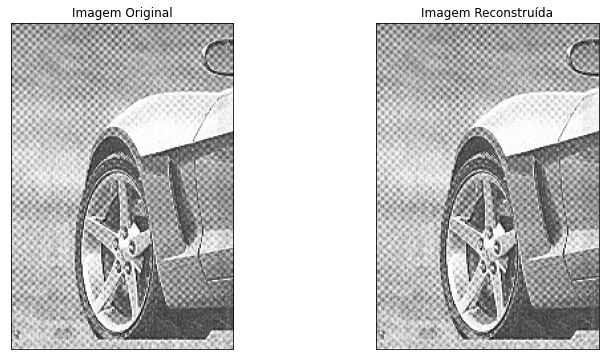

<Figure size 432x288 with 0 Axes>

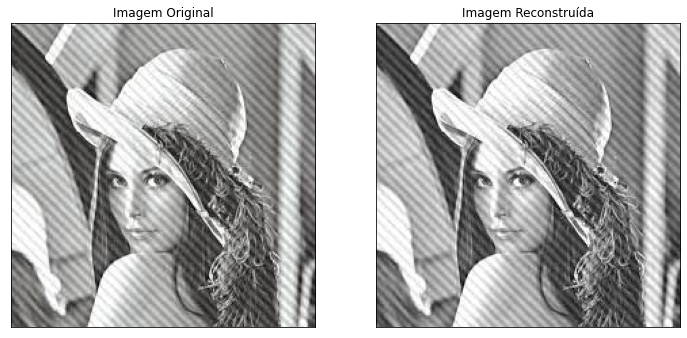

<Figure size 432x288 with 0 Axes>

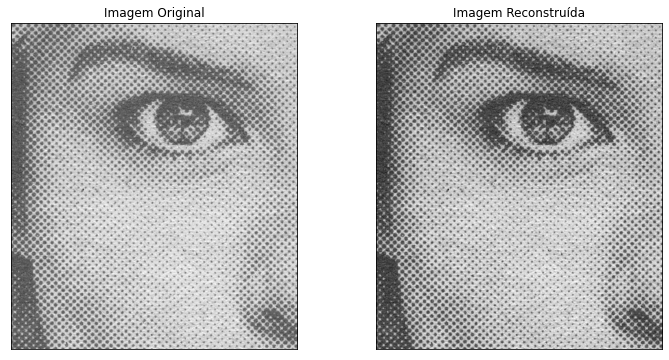

<Figure size 432x288 with 0 Axes>

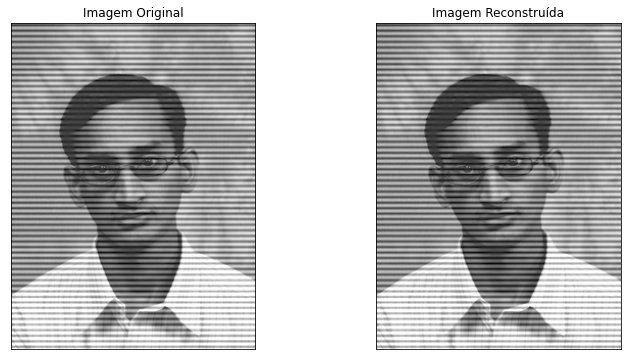

<Figure size 432x288 with 0 Axes>

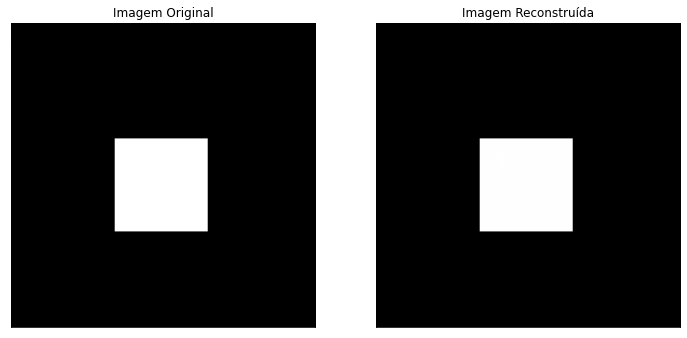

In [16]:
def apply_inverse_fourier_transform(original_img, dft_shift):
    
    # Desfazer o deslocamento (shift) do espectro de Fourier
    f_transform_unshifted = np.fft.ifftshift(dft_shift)
    
    # Aplicar a Transformada Inversa de Fourier 2D usando o OpenCV
    # inverse_transform = cv2.idft(f_transform_unshifted)
    inverse_transform = np.fft.ifft2(f_transform_unshifted)
    
    # Calcular o espectro de magnitude da transformada inversa
    # inverse_magnitude_spectrum = cv2.magnitude(inverse_transform[:, :, 0], inverse_transform[:, :, 1])
    inverse_magnitude_spectrum = np.abs(inverse_transform)
    
    # Normalizar os valores para o intervalo de 0 a 255
    inverse_magnitude_spectrum = cv2.normalize(inverse_magnitude_spectrum, None, 0, 255, cv2.NORM_MINMAX)
    
    # Converter para tipo de dados uint8 (imagem em tons de cinza)
    inverse_transformed_image = np.uint8(inverse_magnitude_spectrum)
    
        
    # Cria uma figura para exibir a imagem original e a imagem reconstruída
    plt.subplots_adjust(wspace=0.2, hspace=0.01) 
    plt.figure(figsize=(12, 6))

    # Subplot 1: Imagem original em escala de cinza
    plt1 = plt.subplot(1, 2, 1)
    plt1.set_title('Imagem Original')
    plt1.set_xticks([]), plt1.set_yticks([])
    plt1.imshow(original_img, cmap='gray')

    # Subplot 2: Imagem reconstruída a partir do espectro de magnitude
    plt2 = plt.subplot(1, 2, 2)
    plt2.set_title('Imagem Reconstruída')
    plt2.set_xticks([]), plt2.set_yticks([])
    plt2.imshow(inverse_transformed_image, cmap='gray')

    # Exibe a figura com as duas imagens
    plt.show()

    
    return inverse_transformed_image

i = 0
for img in [img_car, img_lena_periodic_noise, img_newspaper_shot_woman, img_periodic_noise, img_sinc]:
    inverse_fourier_img = apply_inverse_fourier_transform(img,fourier_img[i][2])
    i+=1

O código a seguir aplica a Transformada de Fourier Discreta (DFT) e a Transformada Inversa de Fourier em uma imagem com fundo preto e quadrado branco no centro representando a função sinc(x,y) e exibe os resultados plotando as imagens.

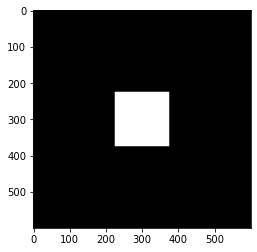

<Figure size 432x288 with 0 Axes>

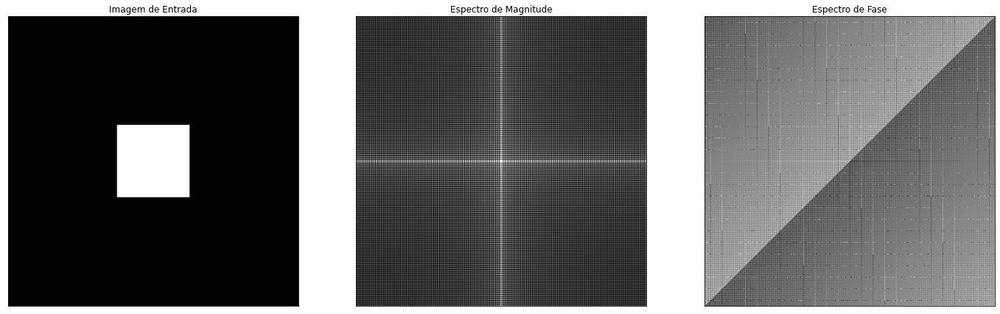

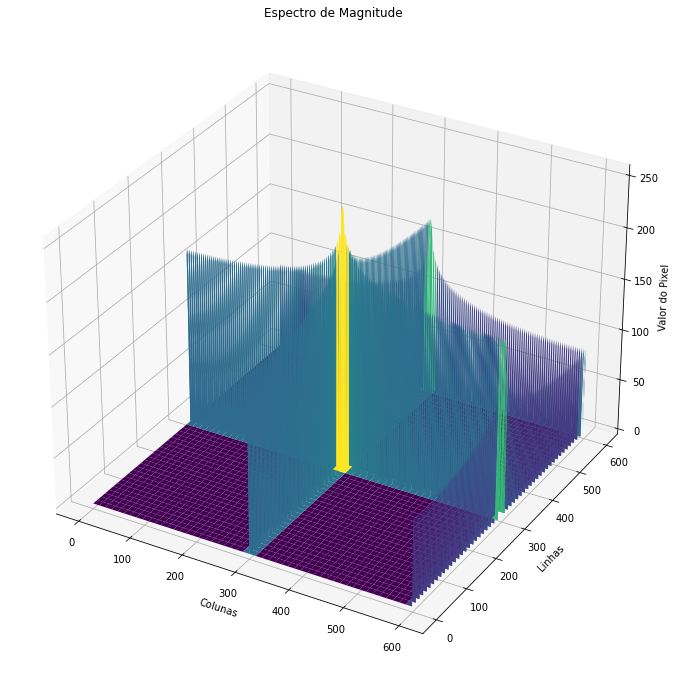

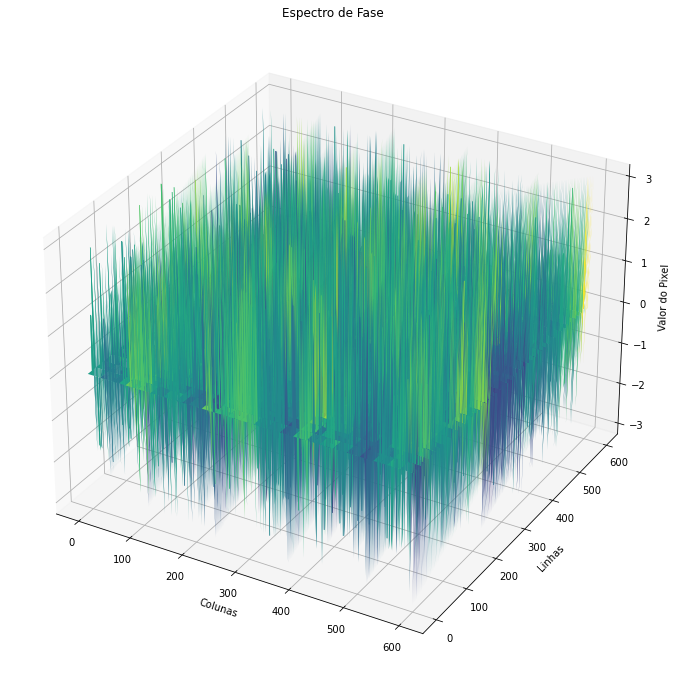

<Figure size 432x288 with 0 Axes>

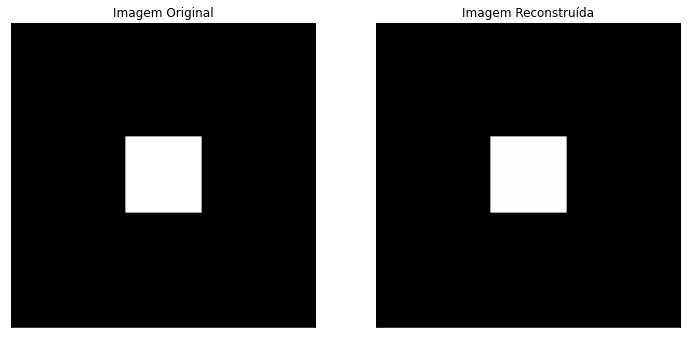

In [17]:
img_white_square = np.zeros((600, 600, 3), dtype=np.uint8)
img_white_square[225:375, 225:375] = (255, 255, 255)
# mostrar imagem
plt.imshow(img_white_square)
plt.show()

# aplicar a transformada de Fourier
magnitude_spectrum, phase_spectrum, dft_shift = apply_fourier_transform(img_white_square)

# aplicar a transformada inversa de Fourier
inverse_fourier_img = apply_inverse_fourier_transform(img_white_square, dft_shift)
